In [220]:
from observational_fear.traces import TraceHandler
from observational_fear.config import BlockConfig, FreezeConfig

from pathlib import Path 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from umap import UMAP

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import make_pipeline

from matplotlib.colors import LinearSegmentedColormap
from tqdm.notebook import tqdm
from sklearn.preprocessing import RobustScaler, QuantileTransformer, PowerTransformer, MinMaxScaler

In [2]:
DATA_DIR = Path(r"C:\Users\roryl\data\OFL")
save_dir = DATA_DIR / "derived" / "tradjectories"
save_dir.mkdir(exist_ok=True, parents=True)

In [3]:
config1 = BlockConfig(
    data_dir=DATA_DIR, 
    block="US", 
    t_before=10, 
    t_after=10, 
    session="day2",
    coreg_only=True
    )
th1= TraceHandler(config1)

config2 = BlockConfig(
    data_dir=DATA_DIR, 
    block="US", 
    t_before=10, 
    t_after=10, 
    session="day4",
    coreg_only=True
    )
th2= TraceHandler(config2)

In [246]:
import warnings
def get_average_trace(th: TraceHandler, shuffle=False) -> pd.DataFrame:
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore")
        df = th.aligned if not shuffle else th.generate_rotated()
        df = df.drop("trial", axis=1).groupby(["new_id", "mouse_name", "aligned"]).mean()
        
    return df

def get_stacked_average_traces(th1: TraceHandler, th2: TraceHandler, names, shuffle=False):
    df1 = get_average_trace(th1, shuffle=shuffle)
    df1 = pd.concat([df1], keys=[names[0]], names=["event"])
    df2 = get_average_trace(th2, shuffle=shuffle)
    df2 = pd.concat([df2], keys=[names[1]], names=["event"])
    df =  pd.concat([df1, df2])
    df = df.reset_index().pivot(index=["event", "aligned"], columns="new_id", values="value")
    return df


# def plot_trajectory_scatter(df_average_trajectories, ax=None):
#         ax = self._get_ax(ax)
#         ax = self.vis.plot_trajectories_pc_space_2d(df_average_trajectories, compare_col=self.compare_col, cmaps=self.cmaps, ax=ax, markers=["o", "o"])
#         at_0 = df_average_trajectories.loc[lambda x: x["aligned"] == 0]
#         ax.scatter(x=at_0["PC1"], y=at_0["PC2"], s=70, marker="+", color="black")
#         ax.set_xlabel("PC1")
#         ax.set_ylabel("PC2")
#         return ax

In [5]:
df = get_stacked_average_traces(th1, th2, names=["usd2", "usd4"])

In [345]:
from sklearn.metrics.pairwise import paired_euclidean_distances, paired_distances, PAIRED_DISTANCES

class UMapDecomposer:

    def __init__(self, n_components=2, umap_kwargs=None):
        self.n_components = n_components
        self.umap_kwargs = umap_kwargs
        if umap_kwargs is None:
            umap_kwargs = {}
        self.mod = UMAP(n_components=n_components, **umap_kwargs)
    
    def fit(self, df):
        self.df_ = df
        self.mod.fit(self.df_.values)
        self.trajectory_df_ = pd.DataFrame(
            self.mod.embedding_, 
            columns=[f"dim-{i}" for i in range(1, self.n_components + 1)], 
            index=self.df_.index
            )
        return self
    
    def reconstruction_error(self, scaler=None):
        real = self.df_.values
        recontructed = self.mod.inverse_transform(self.trajectory_df_.values)
        if scaler is not None:
            recontructed = scaler.fit_transform(recontructed)
        norm_diff = np.linalg.norm(real - recontructed)
        norm_real = np.linalg.norm(real)
        return (1 - (norm_diff / norm_real)) * 100, real, recontructed
    
    def get_embedding(self):
        return self.trajectory_df_
    
    # def get_trajectory_distance(self, metric="euclidean", event_col="event"):
    #     df_res = self.get_embedding().reset_index()
    #     names = df_res[event_col].unique()
    #     # assert len(names) == 2, "More than two events"
    #     df1 = df_res.query(f"event == '{names[0]}'").sort_values("aligned")
    #     df2 = df_res.query(f"event == '{names[1]}'").sort_values("aligned")

    #     df = df2[["aligned"]].copy()
    #     df["distance_both"] = paired_distances(df1[["dim-2", "dim-1"]].values, df2[["dim-2", "dim-1"]].values, metric=metric)
    #     df["distance_dim-1"] = paired_distances(df1[["dim-1"]], df2[["dim-1"]], metric=metric)
    #     df["distance_dim-2"] = paired_distances(df1[["dim-2"]], df2[["dim-2"]], metric=metric)
    #     return df
    
    def transform(self, X):
        return self.mod.transform(X)
    

In [417]:
class TrajectoryStats():

    def get_trajectory_distance(self, trajectory, metric="euclidean", event_col="event"):
        df_res = trajectory
        names = df_res[event_col].unique()
        # print(names)
        # print(df_res)
        df1 = df_res.query(f"event == '{names[0]}'").sort_values("aligned")
        df2 = df_res.query(f"event == '{names[1]}'").sort_values("aligned")

        df = df2[["aligned"]].copy()
        df["distance"] = paired_distances(df1[["dim-2", "dim-1"]].values, df2[["dim-2", "dim-1"]].values, metric=metric)
        return df

In [457]:
from sklearn.base import clone
from copy import deepcopy

class Runner:
    """Runs the experiment. 
    Takes the trace handlers and the decomposer. 
    Uses the decomposer to get the tradjectories and the stats.
     
    """

    def __init__(self, trace_handlers, names, scaler, decomposer: UMapDecomposer, n_boot=75):
        self.trace_handlers = trace_handlers
        self._scaler_blueprint = deepcopy(scaler)
        self._decomposer_blueprint = deepcopy(decomposer)
        self.names = names
        self.scaler = scaler
        self.df = get_stacked_average_traces(trace_handlers[0], trace_handlers[1], names=names, shuffle=False)
        self.df = pd.DataFrame(self.scaler.fit_transform(self.df), index=self.df.index, columns=self.df.columns)
        self.decomposer = decomposer
        self.n_boot = n_boot
        self.stats = TrajectoryStats()
    
    def get_trajectories(self):
        self.decomposer.fit(self.df)
        self.trajectories_ = self.decomposer.get_embedding()
        return self.trajectories_
    
    def get_reconstruction_error(self, scale=False):
        if scale:
            scaler = clone(self._decomposer_blueprint)
        else:
            scaler = None
        self.reconstruction_error_ =  self.decomposer.reconstruction_error(scaler=scaler)
        return self.reconstruction_error_
    
    def get_distances(self, metric="euclidean"):
        distance_real = self.stats.get_trajectory_distance(self.trajectories_.reset_index(), metric=metric, event_col="event")
        return distance_real

    
    def get_shuffled_trajectories(self, n_boot=75, metric="euclidean"):
        df_trajectories = []
        df_distances = []
        for i in tqdm(range(n_boot)):
            df = get_stacked_average_traces(self.trace_handlers[0], self.trace_handlers[1], names=self.names, shuffle=True)
            decomposer = deepcopy(self._decomposer_blueprint)
            decomposer.fit(df)
            trajectories = decomposer.get_embedding().assign(boot_idx=i)
            distances = self.stats.get_trajectory_distance(trajectories.reset_index(), metric=metric, event_col="event").assign(boot_idx=i)
            df_trajectories.append(trajectories)
            df_distances.append(distances)
        return pd.concat(df_trajectories).reset_index(), pd.concat(df_distances).reset_index(drop=True)

    

In [ ]:
runner = Runner(
    [th1, th2], 
    names=["usd2", "usd4"], 
    decomposer=UMapDecomposer(n_components=2, umap_kwargs=dict(n_neighbors=30, metric="euclidean")), 
    scaler=StandardScaler(with_std=False)
    )
df_trajectories = runner.get_trajectories().reset_index()
df_distances = runner.get_distances(metric="euclidean")
df_trad_reps, df_dist_reps = runner.get_shuffled_trajectories(n_boot=75)

In [485]:
class MultiRunner(Runner):
    def __init__(self, trace_handlers, names, scaler, decomposer: UMapDecomposer, n_boot=75):
        self.trace_handlers = trace_handlers
        self.names = names
        self._scaler_blueprint = deepcopy(scaler)
        self._decomposer_blueprint = deepcopy(decomposer)
        self.scaler = scaler
        self.decomposer = decomposer
        self.n_boot = n_boot
        self.stats = TrajectoryStats()

        self.df_true_ = get_stacked_average_traces(trace_handlers[0], trace_handlers[1], names=[n + "_true" for n in names], shuffle=False)
        self.df_shuffle_ = get_stacked_average_traces(trace_handlers[0], trace_handlers[1], names=[n + "_shuffle" for n in names], shuffle=True)
        self.df = pd.concat([self.df_true_, self.df_shuffle_])   
        self.df = pd.DataFrame(self.scaler.fit_transform(self.df), index=self.df.index, columns=self.df.columns)
    
    def get_distances(self, metric="euclidean"):
        # print(self.trajectories_)
        df_real = self.trajectories_.reset_index().loc[lambda x: x.event.isin([f"{n}_true" for n in self.names])]
        df_shuffle = self.trajectories_.reset_index().loc[lambda x: x.event.isin([f"{n}_shuffle" for n in self.names])]

        distance_real = self.stats.get_trajectory_distance(df_real, metric=metric, event_col="event").assign(group="real")
        distance_shuffle = self.stats.get_trajectory_distance(df_shuffle, metric=metric, event_col="event").assign(group="shuffle")
        return pd.concat([distance_real, distance_shuffle]).reset_index(drop=True).pivot(index="aligned", columns="group", values="distance").reset_index()

In [486]:
runner = MultiRunner(
    [th1, th2], 
    names=["usd2", "usd4"], 
    decomposer=UMapDecomposer(n_components=2, umap_kwargs=dict(n_neighbors=40, metric="euclidean")), 
    scaler=StandardScaler(with_std=False)
    )
df_trajectories = runner.get_trajectories().reset_index()
df_distances = runner.get_distances(metric="euclidean")

In [488]:
df_distances

group,aligned,real,shuffle
0,-10.0,16.112391,31.712990
1,-9.9,16.037994,31.713869
2,-9.8,16.093887,31.730034
3,-9.7,16.256792,31.713774
4,-9.6,16.241812,31.671387
...,...,...,...
196,9.6,37.580776,36.344276
197,9.7,37.579350,36.283401
198,9.8,37.568203,36.301247
199,9.9,37.604858,36.300323


<AxesSubplot:xlabel='aligned'>

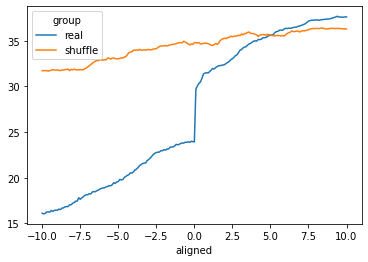

In [487]:
df_distances.set_index("aligned").plot()

In [461]:
# dfp = df_trajectories.melt(id_vars=["event", "aligned"], var_name="metric")

# g= sns.FacetGrid(data=dfp, row="metric", height=(2), aspect=3.5, sharey=False).map_dataframe(sns.lineplot, x="aligned", y="value", hue="event")
# g.add_legend()


In [462]:
# df_distances

In [478]:
runner = Runner(
    [th1, th2], 
    names=["usd2", "usd4"], 
    decomposer=UMapDecomposer(n_components=2, umap_kwargs=dict(n_neighbors=30, metric="euclidean")), 
    scaler=StandardScaler(with_std=False)
    )
df_trajectories = runner.get_trajectories().reset_index()
df_distances = runner.get_distances(metric="euclidean")
df_trad_reps, df_dist_reps = runner.get_shuffled_trajectories(n_boot=75)

  0%|          | 0/75 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
# df_dist_reps

<AxesSubplot:xlabel='aligned', ylabel='distance'>

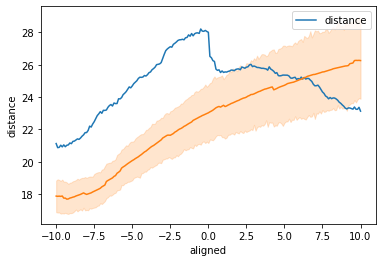

In [484]:
ax = df_distances.set_index("aligned")["distance"].plot()

sns.lineplot(data=df_dist_reps, x="aligned", y="distance", ax=ax)

<AxesSubplot:xlabel='dim-1', ylabel='dim-2'>

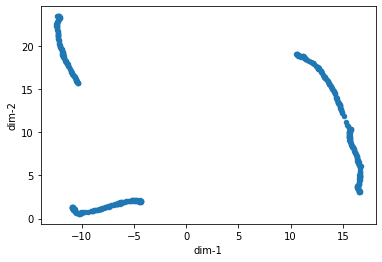

In [479]:
df_trajectories.set_index("aligned").plot(kind="scatter", x="dim-1", y="dim-2")

<AxesSubplot:xlabel='dim-1', ylabel='dim-2'>

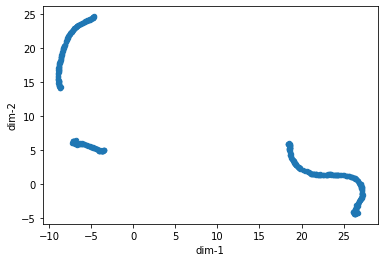

In [483]:
df_trad_reps.query("boot_idx == 73").set_index("aligned").plot(kind="scatter", x="dim-1", y="dim-2")

71.12608675749567


<AxesSubplot:>

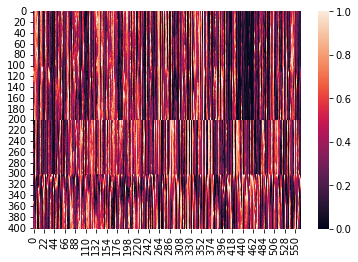

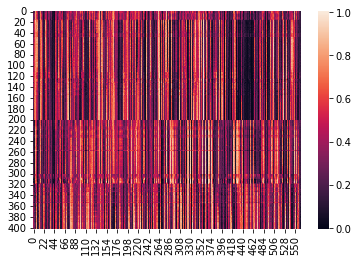

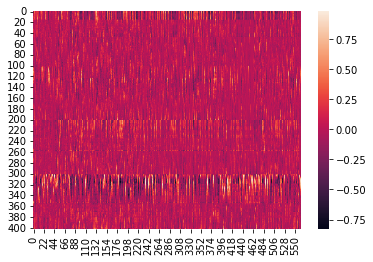

In [214]:
import seaborn as sns
print(score)

plt.figure()
sns.heatmap(real)

plt.figure()
sns.heatmap(reconstructed)

plt.figure()
sns.heatmap(np.abs(real) - np.abs(reconstructed))

In [18]:
from sklearn.metrics import r2_score

X1 = df_res[["dim-1", "dim-2"]].values
X1 = df_res[["dim-1", "dim-2"]].values 

r2_score(X1, X1)

1.0

In [35]:
usd2 = df_res.query(f"event == 'usd2'").sort_values("aligned")
usd4 = df_res.query(f"event == 'usd4'").sort_values("aligned")

df = usd2[["aligned"]].copy()
df["distance_both"] = paired_distances(usd2[["dim-2", "dim-1"]].values, usd4[["dim-2", "dim-1"]].values, metric="euclidean")
df["distance_dim-1"] = paired_distances(usd2[["dim-1"]], usd4[["dim-1"]], metric="euclidean")
df["distance_dim-2"] = paired_distances(usd2[["dim-2"]], usd4[["dim-2"]], metric="euclidean")

In [20]:

usd2 = df_res.query(f"event == 'usd2'").sort_values("aligned")[["dim-1", "dim-2"]]
usd4 = df_res.query(f"event == 'usd4'").sort_values("aligned")[["dim-1", "dim-2"]]

distance = paired_euclidean_distances(usd2, usd4)
# pd.concat([])

In [22]:
# PAIRED_DISTANCES

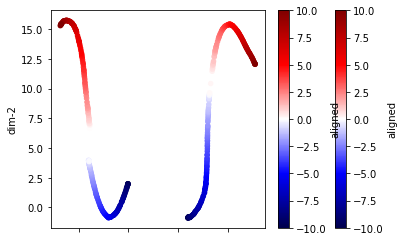

In [115]:
ax = df_res.query("event == 'usd2'").plot(kind="scatter",x="dim-1", y="dim-2", c="aligned", cmap="seismic")
ax = df_res.query("event == 'usd4'").plot(kind="scatter",x="dim-1", y="dim-2", c="aligned", cmap="seismic", ax=ax)

In [244]:
from sklearn.preprocessing import RobustScaler

In [263]:
# single double

df1 = th1.aligned.pivot_table(index="aligned", columns="new_id", values="value")

df2 = th2.aligned.pivot_table(index="aligned", columns="new_id", values="value")

df = pd.concat([df1, df2])

X = df.values

mod = UMAP(metric="cosine", n_neighbors=20, min_dist=0.4).fit(RobustScaler().fit_transform(X))
emb = mod.transform(X)
df_emb = pd.DataFrame(emb, index=df.index, columns=["Dim-1", "Dim-2"]).reset_index()

df_emb["session"] = (["day2"] * len(df1)) + (["day4"] * len(df2))

px.scatter(df_emb, x="Dim-1", y="Dim-2", color="aligned", hover_data =["session"])

In [264]:
config1 = FreezeConfig(
    data_dir=DATA_DIR, 
    start_stop="start",
    t_before=10, 
    t_after=10, 
    session="day2",
    )
th1= TraceHandler(config1)

config2 = FreezeConfig(
    data_dir=DATA_DIR, 
    start_stop="stop",
    t_before=10, 
    t_after=10, 
    session="day2",
    )
th2= TraceHandler(config2)

In [297]:
# single double

df1 = th1.aligned.pivot_table(index="aligned", columns="new_id", values="value")

df2 = th2.aligned.pivot_table(index="aligned", columns="new_id", values="value")

df = pd.concat([df1, df2])


X = df.values
y1 = np.where(df.index < 0, 0, 1)
y2 = np.array( ([0] * len(df1) )+ ([2] * len(df2)) )
y = y1 + y2


mod = UMAP(n_neighbors=20, min_dist=0.4, n_components=2).fit(RobustScaler().fit_transform(X))
# emb = mod.transform(X)

# df_emb = pd.DataFrame(emb, index=df.index, columns=["Dim-1", "Dim-2"]).reset_index()
# df_emb = pd.DataFrame(emb, index=df.index, columns=["Dim-1", "Dim-2", "Dim-3"]).reset_index()


df_emb["start_stop"] = (["start"] * len(df1)) + (["stop"] * len(df2))
df_emb["prepost"] = np.where(y1 == 0, "pre", "post")
df_emb["target"] = df_emb["start_stop"] + "_" + df_emb["prepost"]

f = px.scatter(df_emb, x="Dim-1", y="Dim-2", color="target", hover_data=["aligned"])
# f = px.scatter_3d(df_emb, x="Dim-1", y="Dim-2", z="Dim-3", color="target", hover_data=["aligned"])
f.show()

In [301]:
df.index.get_level_values(1)

Float64Index([-10.0,  -9.9,  -9.8,  -9.7,  -9.6,  -9.5,  -9.4,  -9.3,  -9.2,
               -9.1,
              ...
                9.1,   9.2,   9.3,   9.4,   9.5,   9.6,   9.7,   9.8,   9.9,
               10.0],
             dtype='float64', name='aligned', length=22908)

In [310]:
# single double

# df1 = th1.aligned_wide

# df2 = th2.aligned_wide

# df = pd.concat([df1, df2])


# X = df.values
# y1 = np.where(df.index.get_level_values(1) < 0, 0, 1)
y2 = np.array( ([0] * len(df1) )+ ([2] * len(df2)) )
# y = y1 + y2


mod = UMAP(n_neighbors=20, min_dist=0.4, n_components=2).fit(RobustScaler().fit_transform(X))

df_emb = pd.DataFrame(mod.embedding_, index=df.index, columns=["Dim-1", "Dim-2"]).reset_index()


df_emb["start_stop"] = (["start"] * len(df1)) + (["stop"] * len(df2))
df_emb["prepost"] = np.where(y1 == 0, "pre", "post")
df_emb["target"] = df_emb["start_stop"] + "_" + df_emb["prepost"]

f = px.scatter(df_emb, x="Dim-1", y="Dim-2", color="target", hover_data=["aligned"])
f.show()

c:\Users\roryl\.conda\envs\observational-fear\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



In [311]:
# single double

df1 = th1.aligned.pivot_table(index="aligned", columns="new_id", values="value")

df2 = th2.aligned.pivot_table(index="aligned", columns="new_id", values="value")

df = pd.concat([df1, df2])


X = df.values
y1 = np.where(df.index < 0, 0, 1)
y2 = np.array( ([0] * len(df1) )+ ([2] * len(df2)) )
y = y1 + y2


mod = UMAP(n_neighbors=20, min_dist=0.4, n_components=2).fit(RobustScaler().fit_transform(X))



# df_emb["start_stop"] = (["start"] * len(df1)) + (["stop"] * len(df2))
# df_emb["prepost"] = np.where(y1 == 0, "pre", "post")
# df_emb["target"] = df_emb["start_stop"] + "_" + df_emb["prepost"]

# f = px.scatter(df_emb, x="Dim-1", y="Dim-2", color="target", hover_data=["aligned"])
# # f = px.scatter_3d(df_emb, x="Dim-1", y="Dim-2", z="Dim-3", color="target", hover_data=["aligned"])
# f.show()

In [317]:
df_res = pd.concat((
    th1.aligned.copy().assign(start_stop="start"),
    th2.aligned.copy().assign(start_stop="stop"),
))

In [323]:
def decompose(df, m):
    X = RobustScaler().fit_transform(df.pivot(index="aligned", columns="new_id", values="value").values)
    print(np.isnan(X).sum())
    return pd.DataFrame(m.transform(X), columns=["Dim-1", "Dim-2"])

out = df_res.groupby(["trial", "start_stop"]).apply(decompose, m=mod)

4366


ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

In [321]:
df_res.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22653738 entries, 8640213 to 23522040
Data columns (total 7 columns):
 #   Column      Dtype  
---  ------      -----  
 0   time        float64
 1   new_id      object 
 2   value       float64
 3   mouse_name  object 
 4   aligned     float64
 5   trial       float64
 6   start_stop  object 
dtypes: float64(4), object(3)
memory usage: 1.4+ GB


In [98]:
df = px.data.stocks()
print(df.columns)

Index(['date', 'GOOG', 'AAPL', 'AMZN', 'FB', 'NFLX', 'MSFT'], dtype='object')


In [140]:
# px.line(df, x="date", y="GOOG")

# f = px.line(df, x="date", y=["AAPL", "AMZN"], labels=dict(date="Date", AMZN="Amazon"))

fig = go.Figure()

fig.add_trace(
    go.Scatter(x=df.date, y=df.AAPL, mode="lines", name="Apple")
)
fig.add_trace(
    go.Scatter(x=df.date, y=df.AMZN, mode="lines+markers", name="AMZN")
)
fig.add_trace(
    go.Scatter(
        x=df.date, y=df.GOOG, 
        mode="lines+markers", name="Google", line=dict(color="black", width=2)), 
)

fig.update_layout(title="Stock Prices", xaxis_title="Date", 
    xaxis=dict(showline=False, showgrid=False, 
    showticklabels=True, linecolor="black", 
    linewidth=2, tickfont=dict(family="Arial")), margin=dict(autoexpand=True)
)
fig.show()

In [166]:
# bars

df = px.data.gapminder()

df1 = df.query("country == 'United States'")

# px.bar(df1, x="year", y="pop")

df = px.data.tips()
px.bar(df, x="day", y="tip", 
color="sex", 
        title="tips by sex", 
        labels={"tip": "Tip Amount"}
        )

px.bar(df, x="sex", 
        y="total_bill", 
        color="smoker",
        barmode="group", 
        title="bill by sex", 
        labels={"tip": "Tip Amount"}
        )

df = px.data.gapminder()

df1 = df.query("continent == 'Europe' and year == 2007 and pop > 2000000").sort_values("pop")
f = px.bar(df1, x="country", y="pop", text='pop', color="country")
f.update_traces(
        texttemplate="%{text:.2s}", textposition="outside"
)
f.update_layout(uniformtext_minsize=9, xaxis_tickangle=-45)
f.show()

In [190]:
# scatter plots

df = px.data.iris()

# px.scatter(df, x="sepal_width", y="sepal_length", 
# color="species", hover_data=["petal_width"], size="sepal_width")

# f = go.Figure()

# f.add_trace(
#     go.Scatter(
#         x=df.sepal_width, 
#         y=df.sepal_length, 
#         mode="markers",
#         text=df.species,
#         marker_color=df.petal_length,
#         marker=dict(showscale=True, colorscale="Hot"),
#         )
# )
# f.update_traces(marker_line_width=2, marker_size=10)
# f.show()

fig = go.Figure()

fig.add_trace(
    go.Scattergl(
        x=np.random.randn(100000),
        y=np.random.randn(100000),
        mode="markers",
        marker=dict(colorscale="Viridis", color=np.random.random(100000))
    )
)


In [204]:
# df = px.data.gapminder().query("year == 2007 and continent == 'Asia'")
# px.pie(df, values='pop', names='country', title="Population of Asian Countries",
# color_discrete_sequence=px.colors.sequential.RdBu)

# colors = ["blue", "green", "black", "purple", "red", "brown"]

# fig = go.Figure(
#     data=[go.Pie(
#         labels=["Water", "Grass", "Normal"],
#         values=[100, 200, 150],
#         marker=dict(colors=colors)
#     )]
# )
# fig.update_traces(hoverinfo="label+percent", pull=[0, 0, 0.2])
# fig.show()

In [228]:
# ?px.histogram

In [229]:
a = np.random.randn(1000) * 15 + 100
b = np.random.randn(1000) * 10 + 95
df = pd.concat((
    pd.DataFrame({"counts": a, "array": "1"}),
    pd.DataFrame({"counts": b, "array": "2"}),
))



# f = px.histogram(df, x="counts", color="array", color_discrete_sequence=["black", "red"],
#     marginal="violin"
# )
# f.update_layout(
#     xaxis_title_text="Dice Roll",
#     yaxis_title_text="Counts",
#     bargap=0.1
# )

df = px.data.tips()
px.histogram(df, x="total_bill", color="sex",)

TypeError: histogram() got an unexpected keyword argument 'marker'

In [231]:
?mod.fit

Signature: mod.fit(X, y=None)
Docstring:
Fit X into an embedded space.

Optionally use y for supervised dimension reduction.

Parameters
----------
X : array, shape (n_samples, n_features) or (n_samples, n_samples)
    If the metric is 'precomputed' X must be a square distance
    matrix. Otherwise it contains a sample per row. If the method
    is 'exact', X may be a sparse matrix of type 'csr', 'csc'
    or 'coo'.

y : array, shape (n_samples)
    A target array for supervised dimension reduction. How this is
    handled is determined by parameters UMAP was instantiated with.
    The relevant attributes are ``target_metric`` and
    ``target_metric_kwds``.
File:      c:\users\roryl\.conda\envs\observational-fear\lib\site-packages\umap\umap_.py
Type:      method
